<a href="https://colab.research.google.com/github/Aizatulin/Detection-and-classification/blob/main/MODEL_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Айзатулин А. DS-44. Модель 2Б.

In [ ]:
#!mkdir /root/.kaggle
#!touch /root/.kaggle/kaggle.json
#!echo '{"username":"amir101","key":"00407aca32ccc4a2e2c290ceb5f56d59"}' > /root/.kaggle/kaggle.json
#!chmod 600 ~/.kaggle/kaggle.json

In [ ]:
#!kaggle datasets download -d pacogarciam3/lego-brick-sorting-image-recognition
#!unzip -q '/content/drive/MyDrive/Colab Notebooks/DIPLOM/DATA/DATASET2/lego-brick-sorting-image-recognition.zip' 

In [ ]:
import numpy as np 
import pandas as pd 
from matplotlib import pyplot as plt
%matplotlib inline
from tqdm import tqdm

import os
from glob import glob
import cv2
import gc

from scipy import spatial 
from sklearn.model_selection import train_test_split

from tensorflow.keras.datasets import mnist

In [ ]:
def lire_images(img_dir, xdim, ydim, nmax=4000) :
    """ 
    Импорт данных
    """
    label = 0
    label_names = []
    X = []
    y=[]
    for dirname in os.listdir(img_dir):
        print(dirname)
        label_names.append(dirname)
        data_path = os.path.join(img_dir + "/" + dirname,'*g')
        files = glob(data_path)
        n=0
        for f1 in files:
            if n>nmax : break
            try:
                img = cv2.imread(f1) 
                img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) 
                img = cv2.resize(img, (xdim,ydim)) 
                X.append(np.array(img)) 
                y.append(label) 
            except :
                continue
            n=n+1
        print(n,' images ')
        label = label+1
    X = np.array(X)
    y = np.array(y)
    gc.collect() 
    return X,y, label, label_names


In [ ]:
img_rows, img_cols = 120,120
#X,y,Nombre_classes,Classes = lire_images('/content/drive/MyDrive/Colab Notebooks/DIPLOM/DATA2/Cropped Images/', img_rows, img_cols)
X,y,Nombre_classes,Classes = lire_images('/content/drive/MyDrive/Colab Notebooks/DIPLOM/DATA3/DATA/', img_rows, img_cols)

P2x3
42  images 
T1x2
51  images 
B1x4
32  images 
B2x2
33  images 
B2x4
24  images 
D1x4S
39  images 
B2x2C
30  images 
D1x3G
54  images 
B1x2
54  images 
P1x2
51  images 


In [ ]:
#
len(Classes), Classes

(10,
 ['P2x3',
  'T1x2',
  'B1x4',
  'B2x2',
  'B2x4',
  'D1x4S',
  'B2x2C',
  'D1x3G',
  'B1x2',
  'P1x2'])

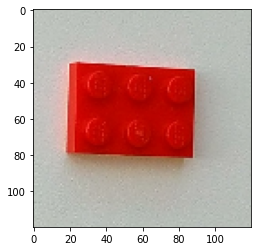

In [ ]:
plt.imshow(X[34])

In [ ]:
X.shape, type(X)

((410, 120, 120, 3), numpy.ndarray)

In [ ]:
X_train,X_test,Y_train,Y_test = train_test_split(X,y,test_size=0.2, random_state=42,shuffle =True)
X_train = X_train.astype('float32') / 255.
X_test = X_test.astype('float32') / 255.

In [ ]:
Y_train.shape, Y_test.shape

((328,), (82,))

In [ ]:
X_train.shape, X_test.shape

((328, 120, 120, 3), (82, 120, 120, 3))

Создани модели.

In [ ]:
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D
from tensorflow.keras.models import Model


input_img = Input(shape=(img_rows, img_cols,3))
encoded = Conv2D(120,(3,3), name='e1',padding="same", activation='relu')(input_img)
encoded = MaxPooling2D(pool_size=(2, 2),name='e2',)(encoded)

encoded = Conv2D(64,(3,3), name='e3', padding="same",activation='relu')(encoded)
encoded = MaxPooling2D(pool_size=(2, 2),name='e4',)(encoded)

encoded = Conv2D(32,(3,3), name='e5', padding="same",activation='relu')(encoded)
encoded = MaxPooling2D(pool_size=(2, 2),name='e6',)(encoded)

encoded = Conv2D(16,(3,3), name='e7', padding="same",activation='relu')(encoded)

decoded = Conv2D(32,(3,3), name='d1', padding="same",activation='relu')(encoded)
decoded = UpSampling2D((2,2),name='d2')(decoded)

decoded = Conv2D(64,(3,3), name='d3', padding="same",activation='relu')(encoded)
decoded = UpSampling2D((2,2),name='d4')(decoded)

decoded = Conv2D(120,(3,3), name='d5', padding="same",activation='sigmoid')(decoded)

decoded = UpSampling2D((2,2),name='d6')(decoded)
decoded = Conv2D(120,(3,3), name='d7', padding="same",activation='relu')(decoded)

decoded = Conv2D(3,(3,3), name='d8', padding="same",activation='sigmoid')(decoded)

decoded = UpSampling2D((2,2),name='d9')(decoded)

autoencoder = Model(input_img, decoded)
autoencoder.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 120, 120, 3)]     0         
                                                                 
 e1 (Conv2D)                 (None, 120, 120, 120)     3360      
                                                                 
 e2 (MaxPooling2D)           (None, 60, 60, 120)       0         
                                                                 
 e3 (Conv2D)                 (None, 60, 60, 64)        69184     
                                                                 
 e4 (MaxPooling2D)           (None, 30, 30, 64)        0         
                                                                 
 e5 (Conv2D)                 (None, 30, 30, 32)        18464     
                                                                 
 e6 (MaxPooling2D)           (None, 15, 15, 32)        0     

In [ ]:
encoder = Model(input_img, encoded)
encoder.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 120, 120, 3)]     0         
                                                                 
 e1 (Conv2D)                 (None, 120, 120, 120)     3360      
                                                                 
 e2 (MaxPooling2D)           (None, 60, 60, 120)       0         
                                                                 
 e3 (Conv2D)                 (None, 60, 60, 64)        69184     
                                                                 
 e4 (MaxPooling2D)           (None, 30, 30, 64)        0         
                                                                 
 e5 (Conv2D)                 (None, 30, 30, 32)        18464     
                                                                 
 e6 (MaxPooling2D)           (None, 15, 15, 32)        0   

In [ ]:
autoencoder.compile(optimizer='adam', loss='binary_crossentropy')

Обучение.

In [ ]:
autoencoder.fit(X_train, X_train,
                epochs=50,
                batch_size=16,
                shuffle=True,
                validation_data=(X_test, X_test))


Epoch 1/50
21/21 [==============================] - 13s 76ms/step - loss: 0.6654 - val_loss: 0.6322
Epoch 2/50
21/21 [==============================] - 1s 39ms/step - loss: 0.6028 - val_loss: 0.5831
Epoch 3/50
21/21 [==============================] - 1s 35ms/step - loss: 0.5817 - val_loss: 0.5733
Epoch 4/50
21/21 [==============================] - 1s 35ms/step - loss: 0.5739 - val_loss: 0.5672
Epoch 5/50
21/21 [==============================] - 1s 36ms/step - loss: 0.5677 - val_loss: 0.5638
Epoch 6/50
21/21 [==============================] - 1s 33ms/step - loss: 0.5665 - val_loss: 0.5665
Epoch 7/50
21/21 [==============================] - 1s 33ms/step - loss: 0.5636 - val_loss: 0.5620
Epoch 8/50
21/21 [==============================] - 1s 32ms/step - loss: 0.5624 - val_loss: 0.5613
Epoch 9/50
21/21 [==============================] - 1s 32ms/step - loss: 0.5623 - val_loss: 0.5616
Epoch 10/50
21/21 [==============================] - 1s 33ms/step - loss: 0.5609 - val_loss: 0.5605
Epoch 11

In [ ]:
#autoencoder.save('/content/drive/MyDrive/Colab Notebooks/DIPLOM/model_MY_50full.hdf5')
from tensorflow.keras.models import load_model
#autoencoder = load_model('/content/drive/MyDrive/Colab Notebooks/DIPLOM/model21_30_train.hdf5')
#autoencoder = load_model('/content/drive/MyDrive/Colab Notebooks/DIPLOM/model21_04_plus.hdf5')
#autoencoder = load_model('/content/drive/MyDrive/Colab Notebooks/DIPLOM/model21_30_plus.hdf5')
#autoencoder = load_model('/content/drive/MyDrive/Colab Notebooks/DIPLOM/model21_20_Class14.hdf5')
#autoencoder = load_model('/content/drive/MyDrive/Colab Notebooks/DIPLOM/model21_50_Class14.hdf5')

#autoencoder = load_model('/content/drive/MyDrive/Colab Notebooks/DIPLOM/model_MY_50full.hdf5')

In [ ]:
encoded_train = encoder.predict(X_train)
encoded_test = encoder.predict(X_test)
encoded_train.shape, encoded_test.shape

3/3 [==============================] - 0s 75ms/step


((328, 15, 15, 16), (82, 15, 15, 16))

In [ ]:
xx = autoencoder.predict(X_test)
xxx = autoencoder.predict(X_train)

11/11 [==============================] - 0s 15ms/step


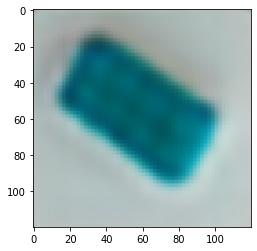

In [ ]:
img = xx[0]
plt.imshow(img)

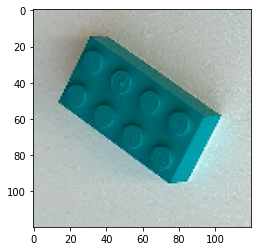

In [ ]:
plt.imshow(X_test[0])

Предсказание.

In [ ]:
# Функция расчета Y_pred (тип детали)
# По encoded_train (см. выше) расчитывается для заданного encoded косинусная близость и выдается лучшая,
# на основе которой, по Y_train, находиться тип детали.

from operator import itemgetter

def FY_pred(img_to_find, out_type=1):
    cosine_list = []
    for index_image,xt in enumerate(encoded_train):
        result = 1 - spatial.distance.cosine(img_to_find.reshape(-1), xt.reshape(-1))
        cosine_list.append(dict({'res':result, 'i':index_image}))
    cosine_list.sort(key=itemgetter('res'), reverse=True)
    if out_type == 1 :  # тип детали
      return Y_train[cosine_list[0]['i']]
    else:      # тип детали               #номер изображения и типа детали (для X и Y _train)
      return Y_train[cosine_list[0]['i']], cosine_list[0]['i']

In [ ]:
Y_pred = np.array([FY_pred(img,1) for img in tqdm(encoded_test)])
Y_pred.shape

100%|██████████| 82/82 [00:01<00:00, 51.99it/s]


(82,)

In [ ]:
from sklearn.metrics import accuracy_score
print('Accuracy: %s' % accuracy_score(Y_test, Y_pred))

Accuracy: 0.9146341463414634


Визуализация предсказания.

In [ ]:
# Функция анализа и визуализации предсказания на выборке test.
# Над картинкой цветом текста показано правильность, в тексте - предсказания (слева) и истинные значения (справа) типа данной детали.

def show_pred(W = 5, start=0, kol=30):
  if kol > 31:
    print ('Много задано')
    return
  test_tensors = X_test[start:start+kol]
  
  encoded_img = encoder.predict(test_tensors)
  Y_pred = [FY_pred(encoded,1) for encoded in tqdm(encoded_img)]
  fig = plt.figure(figsize=(10, 5*14//W), dpi=120)
  plt.rc('font', size= 6)
  no_ok = 0
  for i, img in enumerate(test_tensors):
      subplot = fig.add_subplot(6, W, i+1)
      plt.imshow(img)#[:,:,0]
      if Y_pred[i] == Y_test[i+start]: 
        col = 'g' 
      else: 
        col = 'r'
        no_ok += 1

      subplot.set_title(str(i+start)+'@'+Classes[Y_pred[i]]+'@'+Classes[Y_test[i+start]], c=col)
  print ('No_ok=',no_ok)

1/1 [==============================] - 0s 259ms/step


100%|██████████| 30/30 [00:00<00:00, 54.61it/s]


No_ok= 1


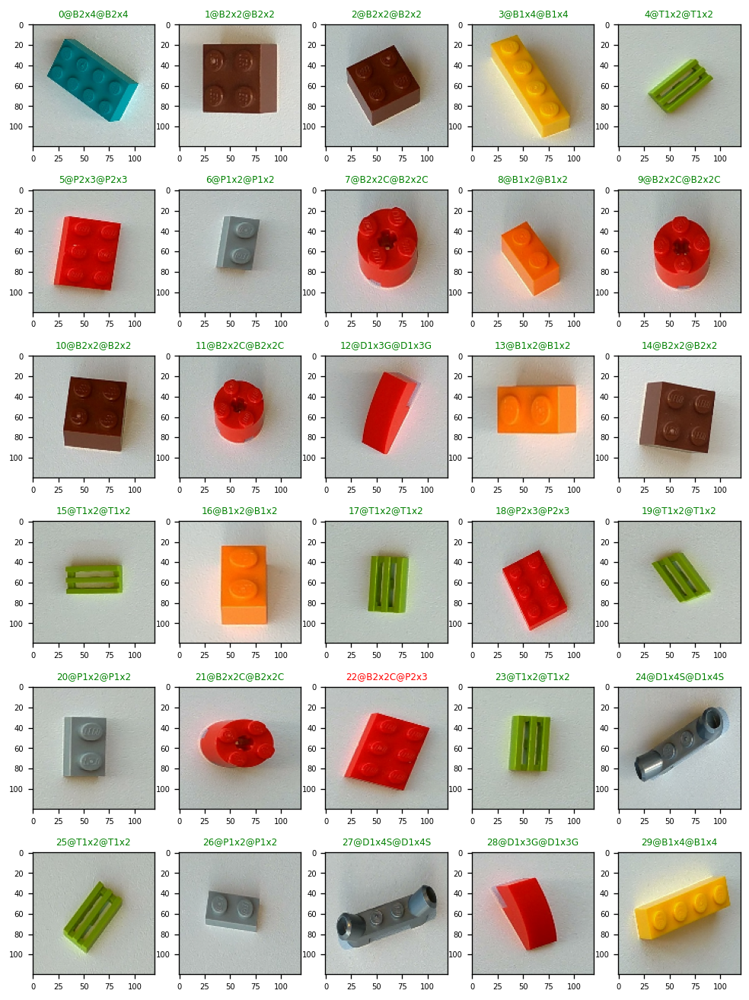

In [ ]:
show_pred(start=0,kol=30)

1/1 [==============================] - 0s 27ms/step


100%|██████████| 30/30 [00:00<00:00, 56.79it/s]


No_ok= 1


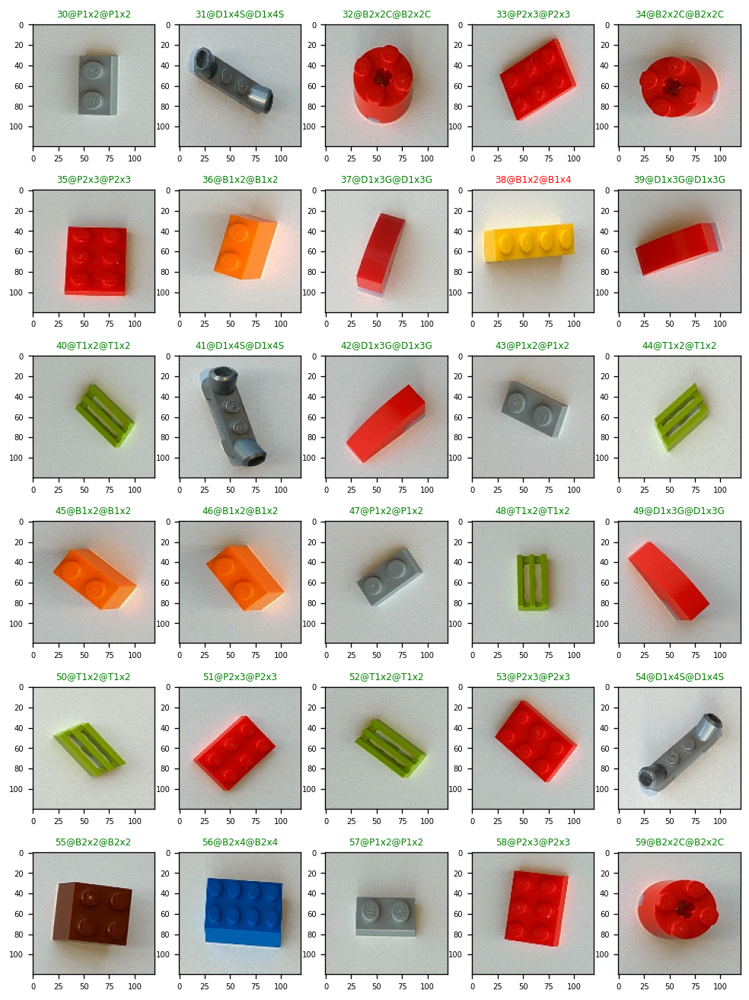

In [ ]:
show_pred(start=30,kol=30)

1/1 [==============================] - 0s 224ms/step


100%|██████████| 22/22 [00:00<00:00, 43.35it/s]


No_ok= 2


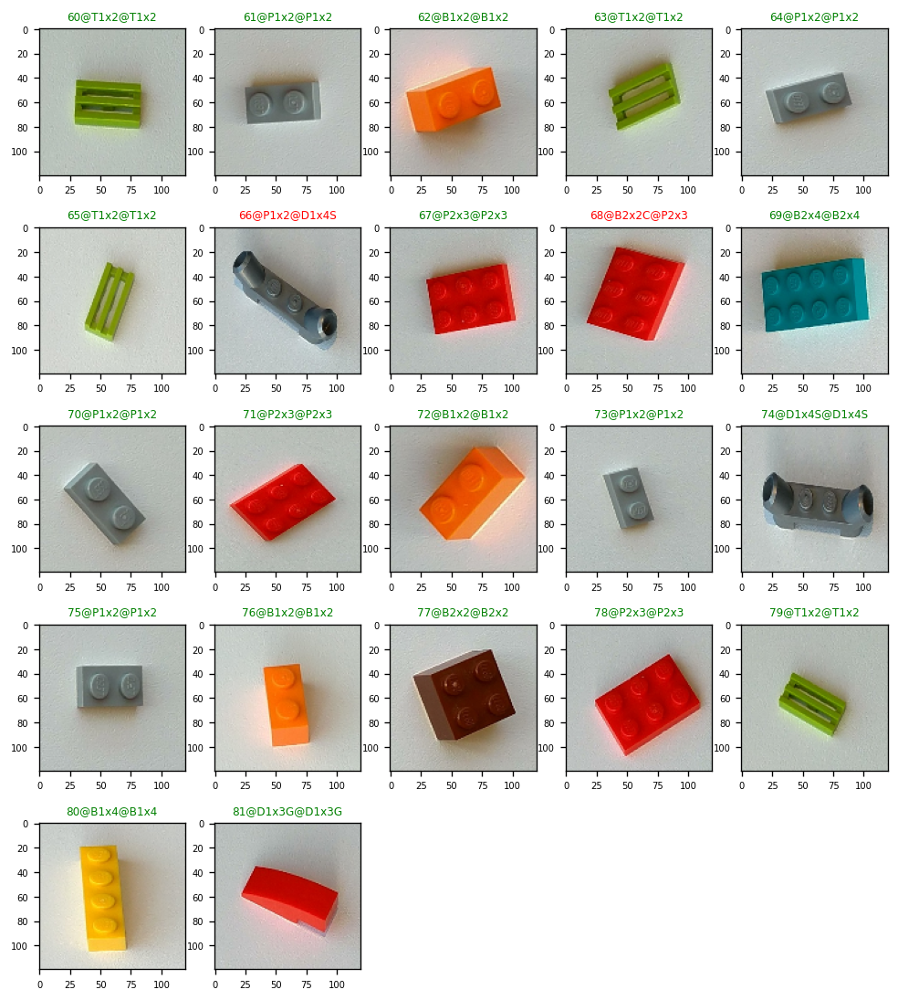

In [ ]:
show_pred(start=60,kol=30)

Предсказание и визуализация по изображениям.

In [ ]:
# Функции для группого анализа изображений в заданной директории
# и отображения их типа ( в заголовках).

def load_img(path, target_size=(img_rows, img_cols)):
    img = cv2.imread(path, cv2.IMREAD_COLOR)[...,::-1]
    img_resized = cv2.resize(img, target_size)
    #convert 3D tensor to 4D tensor
    return np.expand_dims(img_resized, axis=0)

def paths_to_tensor(img_paths):
    list_of_tensors = [load_img(img_path) for img_path in img_paths]
    return np.vstack(list_of_tensors)
    

def show_test(path, W = 5, start=0, kol=30):
  if kol > 31:
    print ('Много задано')
    return
  test_files = glob(path)
  test_files.sort()
  test_files = test_files[start:start+kol]
  test_tensors = paths_to_tensor(test_files).astype('float32')/255
  encoded_img = encoder.predict(test_tensors)
  Y_pred = [FY_pred(encoded,2) for encoded in tqdm(encoded_img)]
  fig = plt.figure(figsize=(12, 5*17//W), dpi=120)
  plt.rc('font', size= 8)
  for i, img in enumerate(test_tensors):
      subplot = fig.add_subplot(6, W, i+1)
      plt.imshow(img)#[:,:,0]
      subplot.set_title(str(Y_pred[i][1])+'@'+Classes[Y_pred[i][0]])

1/1 [==============================] - 0s 28ms/step


100%|██████████| 20/20 [00:04<00:00,  4.66it/s]


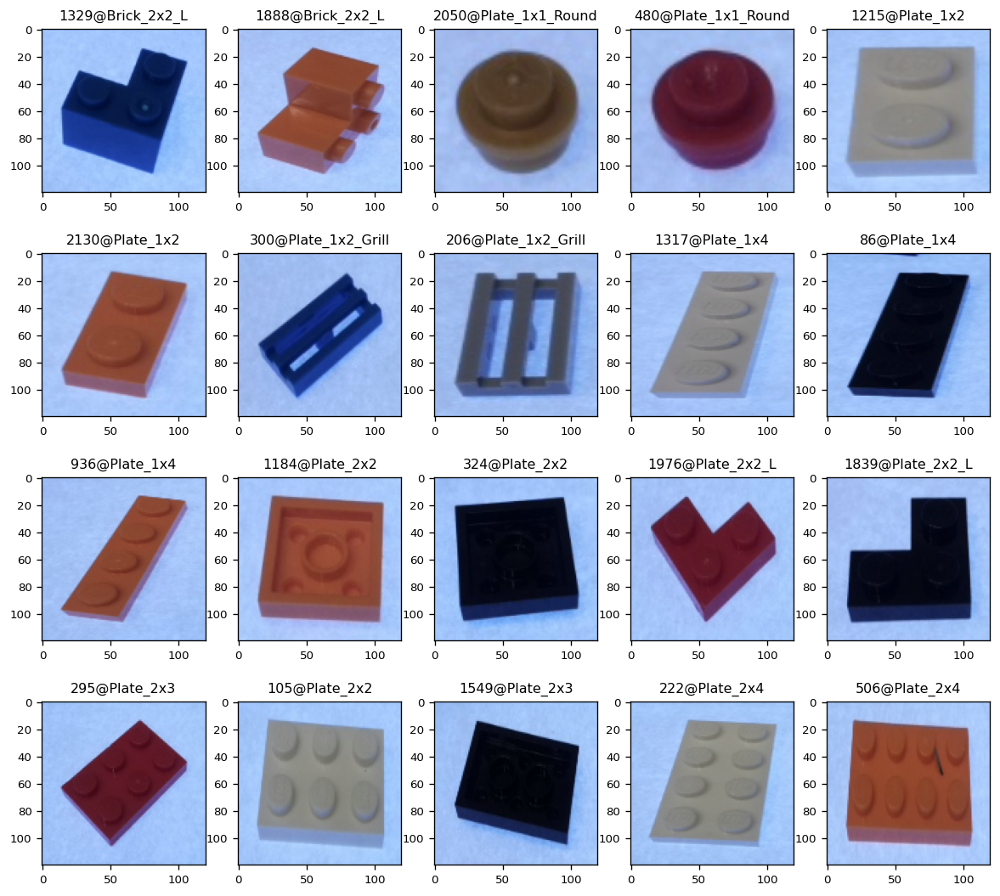

In [ ]:
# Анализ случайной выборки изображений исходных данных. Точность 100%.
show_test('/content/drive/MyDrive/Colab Notebooks/DIPLOM/DATA2/_TEST_crop/*.jpg')

Анализ изображений из первой модели.

1/1 [==============================] - 0s 301ms/step


100%|██████████| 28/28 [00:00<00:00, 31.91it/s]


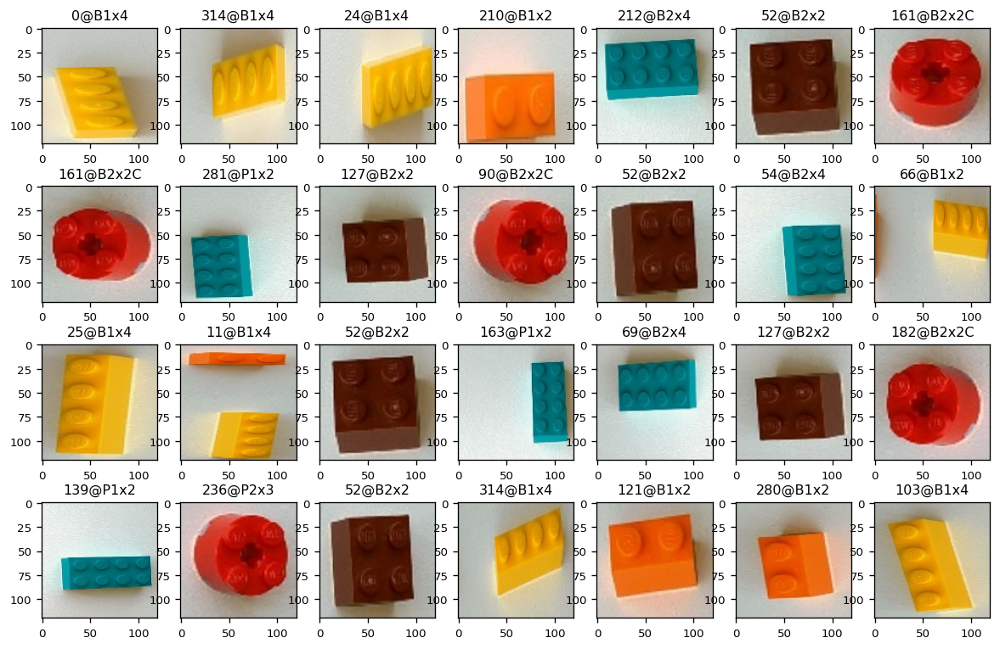

In [ ]:
path1 = '/content/drive/MyDrive/Colab Notebooks/DIPLOM/DATA3/OBMEN/*.jpg'
show_test(path1, start=0, kol=28, W=7)

1/1 [==============================] - 0s 21ms/step


100%|██████████| 28/28 [00:00<00:00, 50.36it/s]


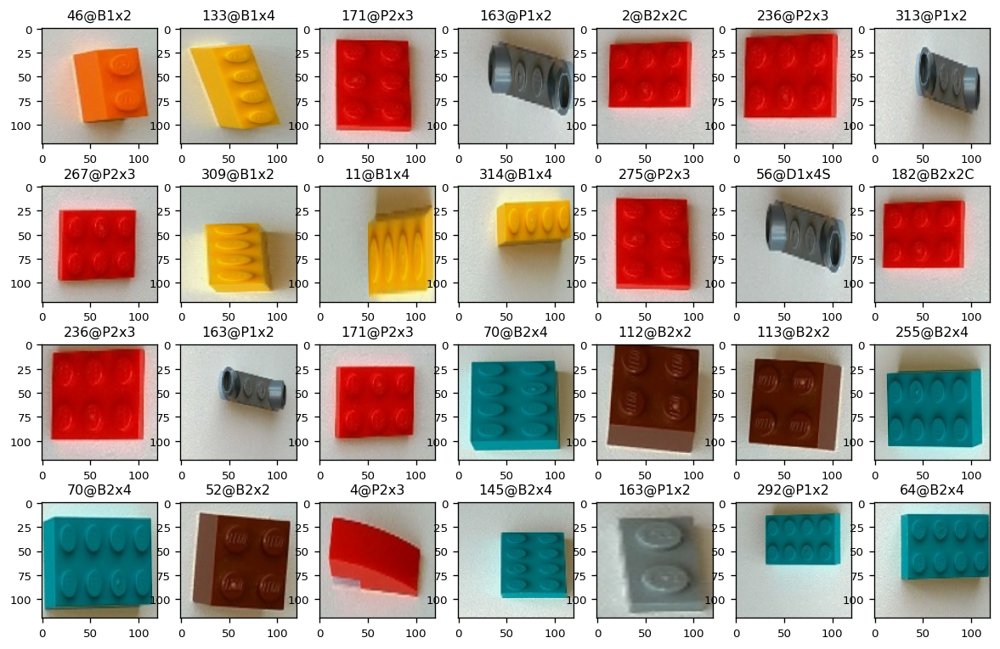

In [ ]:
path1 = '/content/drive/MyDrive/Colab Notebooks/DIPLOM/DATA3/OBMEN/*.jpg'
show_test(path1, start=28, kol=28, W=7)

1/1 [==============================] - 0s 22ms/step


100%|██████████| 28/28 [00:00<00:00, 54.60it/s]


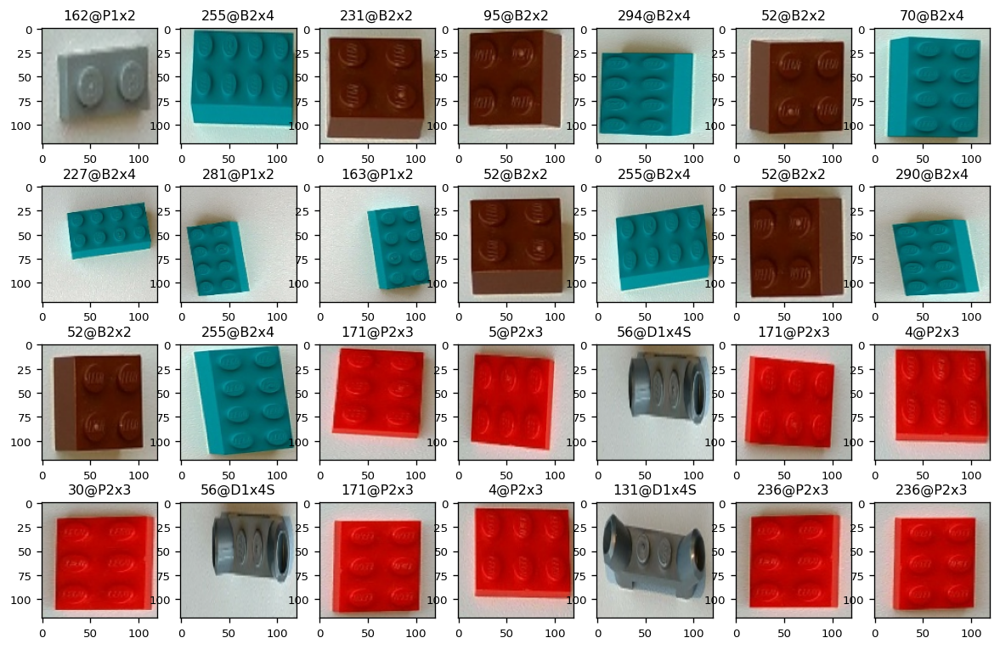

In [ ]:
path1 = '/content/drive/MyDrive/Colab Notebooks/DIPLOM/DATA3/OBMEN/*.jpg'
show_test(path1, start=28+28, kol=28, W=7)

1/1 [==============================] - 0s 85ms/step


100%|██████████| 28/28 [00:01<00:00, 24.09it/s]


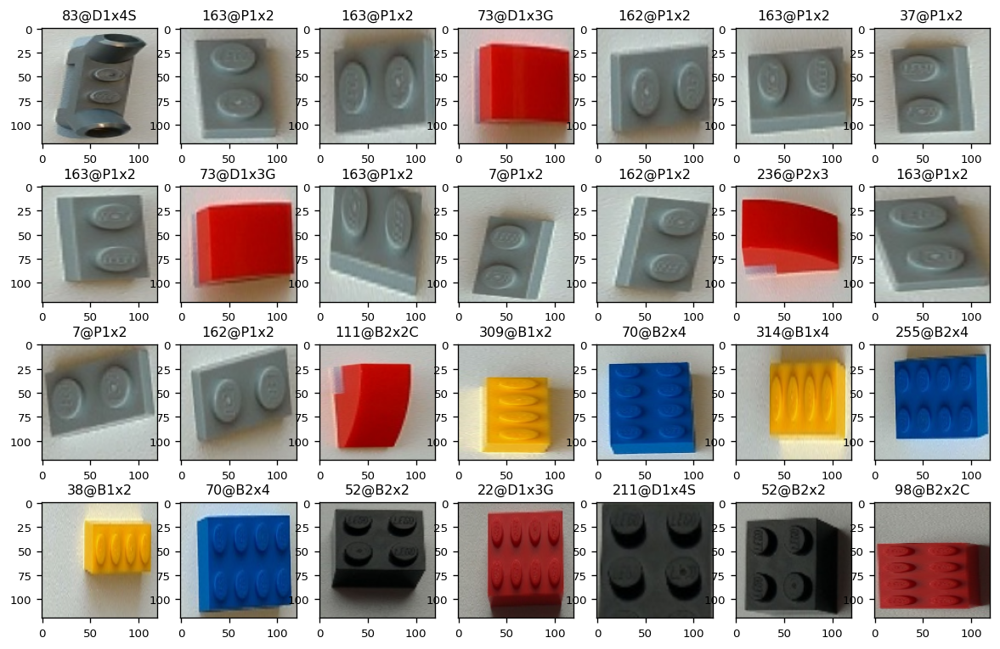

In [ ]:
path1 = '/content/drive/MyDrive/Colab Notebooks/DIPLOM/DATA3/OBMEN/*.jpg'
show_test(path1, start=28+28+28, kol=28, W=7)

1/1 [==============================] - 0s 178ms/step


100%|██████████| 12/12 [00:00<00:00, 48.10it/s]


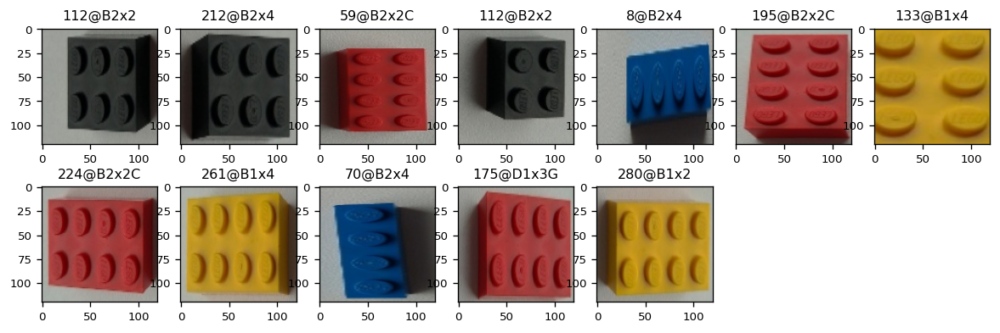

In [ ]:
path1 = '/content/drive/MyDrive/Colab Notebooks/DIPLOM/DATA3/OBMEN/*.jpg'
show_test(path1, start=28+28+28+28, kol=28, W=7)

1/1 [==============================] - 1s 1s/step


100%|██████████| 21/21 [00:06<00:00,  3.20it/s]


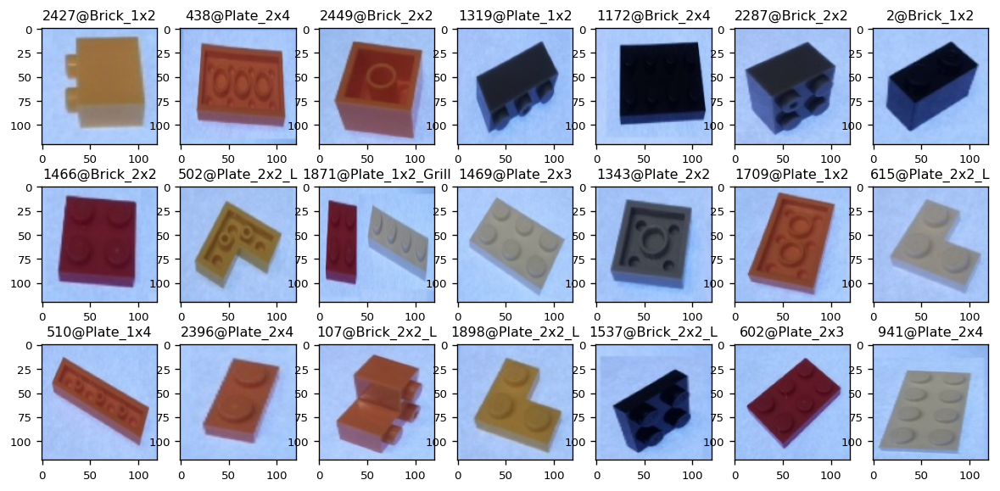

In [ ]:
path1 = '/content/drive/MyDrive/Colab Notebooks/DIPLOM/OBMEN/NEW/*.jpg'
show_test(path1, start=28, W=7)

In [ ]:
path1 = '/content/drive/MyDrive/Colab Notebooks/DIPLOM/OBMEN/NEW/*.jpg'
p = glob(path1)
p.sort()
p

Визуализация лучших вариантов по косинусной выборке для понимания ошибок.
Первое изображение - анализируемое, и пять лучших из X_train.

1/1 [==============================] - 0s 40ms/step


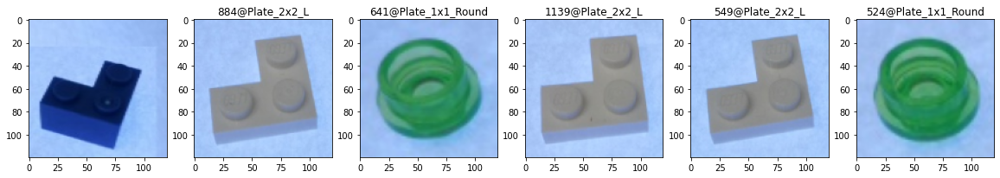

In [ ]:
img_path = '/content/drive/MyDrive/Colab Notebooks/DIPLOM/OBMEN/NEW/_1_0.jpg'
#glob(path_)[31]

%matplotlib inline
from operator import itemgetter

img = load_img(img_path)/255
#img_np = np.array(img).astype('float32')/255
img_to_find = encoder.predict(img)

cosine_list = []
for index_image,xt in enumerate(encoded_train):
    result = 1 - spatial.distance.cosine(img_to_find.reshape(-1), xt.reshape(-1))
    cosine_list.append(dict({'res':result, 'i':index_image}))

cosine_list.sort(key=itemgetter('res'), reverse=True)

fig, ax = plt.subplots(nrows=1, ncols=6,figsize=(20, 4))
plt.gray()
ax[0].imshow(img.reshape(120,120,3))
for indice, row in enumerate(ax):
    if indice==0:continue
#    print (indice,cosine_list[indice]['i'], cosine_list[indice]['res'])
    row.imshow(X_train[cosine_list[indice-1]['i']].reshape(120,120,3))
    row.set_title(str(cosine_list[indice-1]['i'])+'@'+ Classes[Y_train[cosine_list[indice-1]['i']]])
plt.show()

In [ ]:
path_ = '/content/drive/MyDrive/Colab Notebooks/DIPLOM/OBMEN/*.jpg'
for i, p in enumerate(glob(path_)): print (i, p)

0 /content/drive/MyDrive/Colab Notebooks/DIPLOM/OBMEN/_1_0.jpg
1 /content/drive/MyDrive/Colab Notebooks/DIPLOM/OBMEN/_1_2.jpg
2 /content/drive/MyDrive/Colab Notebooks/DIPLOM/OBMEN/_2_0.jpg
3 /content/drive/MyDrive/Colab Notebooks/DIPLOM/OBMEN/_2_1.jpg
4 /content/drive/MyDrive/Colab Notebooks/DIPLOM/OBMEN/_3_2.jpg
5 /content/drive/MyDrive/Colab Notebooks/DIPLOM/OBMEN/_3_1.jpg
6 /content/drive/MyDrive/Colab Notebooks/DIPLOM/OBMEN/_4_1.jpg
7 /content/drive/MyDrive/Colab Notebooks/DIPLOM/OBMEN/_5_2.jpg
8 /content/drive/MyDrive/Colab Notebooks/DIPLOM/OBMEN/_21_3.jpg
9 /content/drive/MyDrive/Colab Notebooks/DIPLOM/OBMEN/_21_0.jpg
10 /content/drive/MyDrive/Colab Notebooks/DIPLOM/OBMEN/_21_4.jpg
11 /content/drive/MyDrive/Colab Notebooks/DIPLOM/OBMEN/_21_1.jpg
12 /content/drive/MyDrive/Colab Notebooks/DIPLOM/OBMEN/_5_0.jpg
13 /content/drive/MyDrive/Colab Notebooks/DIPLOM/OBMEN/_21_2.jpg
14 /content/drive/MyDrive/Colab Notebooks/DIPLOM/OBMEN/_4_0.jpg
15 /content/drive/MyDrive/Colab Notebooks/DIP

In [ ]:
img_to_find.reshape(-1).shape

(3600,)